## Preprocessing and EDA

In [5]:
from pathlib import Path
import os

data_path = Path("/home/mfclabber/fsoco_bounding_boxes_train")

def walk_through_dir(dir_path):
    """Walks through dir_path returning file counts of its contents."""
    for dirpath, dirnames, filenames in os.walk(dir_path):
        print(f"There are {len(dirnames)} directories and {len(filenames)} files in '{dirpath}'.")

walk_through_dir(data_path)

There are 41 directories and 1 files in '/home/mfclabber/fsoco_bounding_boxes_train'.
There are 2 directories and 0 files in '/home/mfclabber/fsoco_bounding_boxes_train/eufs'.
There are 0 directories and 125 files in '/home/mfclabber/fsoco_bounding_boxes_train/eufs/img'.
There are 0 directories and 125 files in '/home/mfclabber/fsoco_bounding_boxes_train/eufs/ann'.
There are 2 directories and 0 files in '/home/mfclabber/fsoco_bounding_boxes_train/ulm'.
There are 0 directories and 558 files in '/home/mfclabber/fsoco_bounding_boxes_train/ulm/img'.
There are 0 directories and 558 files in '/home/mfclabber/fsoco_bounding_boxes_train/ulm/ann'.
There are 2 directories and 0 files in '/home/mfclabber/fsoco_bounding_boxes_train/racetech'.
There are 0 directories and 244 files in '/home/mfclabber/fsoco_bounding_boxes_train/racetech/img'.
There are 0 directories and 244 files in '/home/mfclabber/fsoco_bounding_boxes_train/racetech/ann'.
There are 2 directories and 0 files in '/home/mfclabber/fso

Random image path: /home/mfclabber/fsoco_bounding_boxes_train/ulm/img/ulm_00377.jpg
Image height: 1000
Image width: 1552


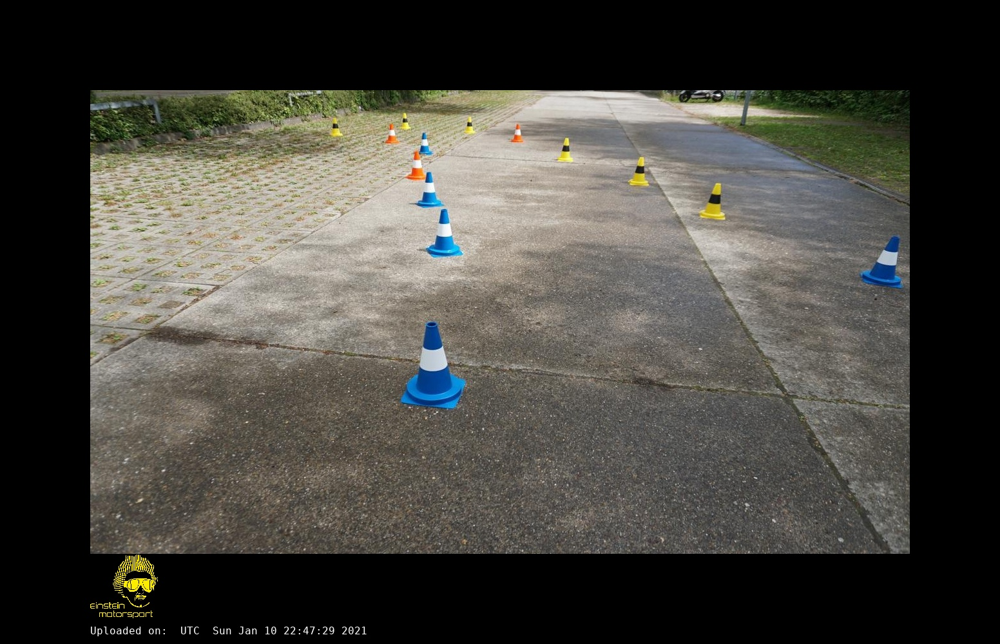

In [6]:
import random
from PIL import Image

image_path_list = sorted(list(data_path.glob("*/img/*.png")) +
                         list(data_path.glob("*/img/*.jpg")))

labels_path_list = sorted(list(data_path.glob("*/ann/*.json")))

random_image_path = random.choice(image_path_list)
img = Image.open(random_image_path)

print(f"Random image path: {random_image_path}")
print(f"Image height: {img.height}")
print(f"Image width: {img.width}")

img

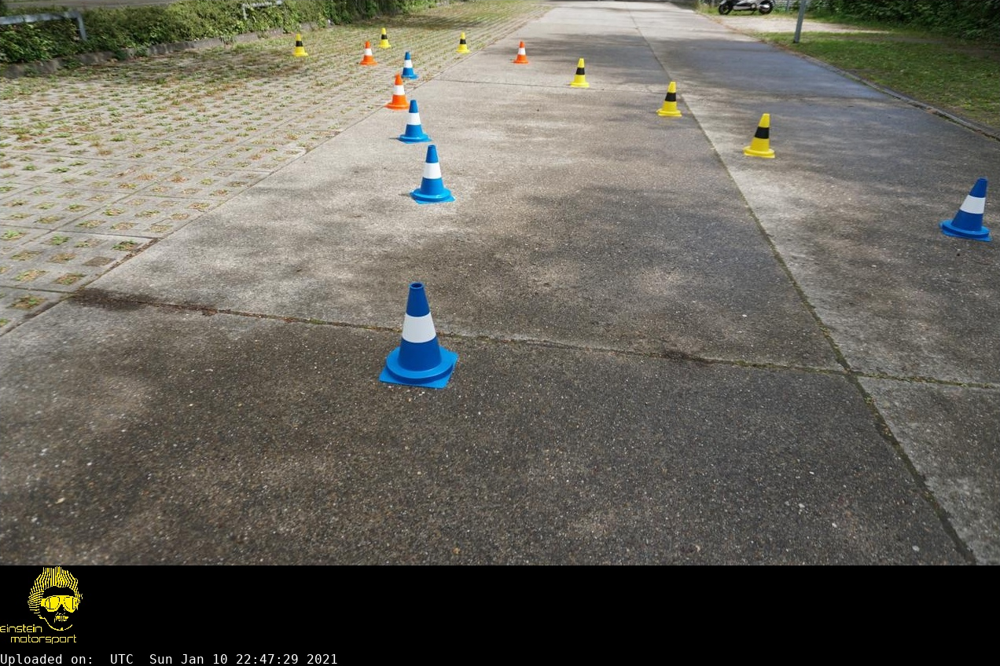

In [7]:
from PIL import Image, ImageChops

def trim_black_borders(image_path, output_path=None, tolerance=10):
    
    img = Image.open(image_path)
    img = img.convert("RGB") 

    pixels = img.load()
    width, height = img.size

    # Функция проверки, является ли пиксель черным (с допуском tolerance)
    def is_black(pixel):
        return all(channel <= tolerance for channel in pixel)

    # Найдем границы рисунка (игнорируя черный фон)
    left = 0
    right = width - 1
    top = 0
    bottom = height - 1

    # Найдем левую границу
    for x in range(width):
        if any(not is_black(pixels[x, y]) for y in range(height)):
            left = x
            break

    # Найдем правую границу
    for x in range(width - 1, -1, -1):
        if any(not is_black(pixels[x, y]) for y in range(height)):
            right = x
            break

    # Найдем верхнюю границу
    for y in range(height):
        if any(not is_black(pixels[x, y]) for x in range(width)):
            top = y
            break

    # Найдем нижнюю границу
    for y in range(height - 1, -1, -1):
        if any(not is_black(pixels[x, y]) for x in range(width)):
            bottom = y
            break

    # Обрезаем изображение по найденным границам
    cropped_img = img.crop((left, top, right + 1, bottom + 1))
#     cropped_img.save(output_path)
    return cropped_img

# Пример использования
image = trim_black_borders(random_image_path)
image

In [8]:
import json

# Распарсить JSON строку
bboxes = []
labels = []
with open(labels_path_list[0], 'r') as j:
    parsed_data = json.loads(j.read())

    # Доступ к данным
    description = parsed_data["description"]
    tags = parsed_data["tags"]
    size = parsed_data["size"]
    objects = parsed_data["objects"]

    print("Описание:", description)
    print("Теги:", tags)
    print("Размеры (высота, ширина):", size["height"], size["width"])

    # Доступ к объектам
    for obj in objects:
        print(f"\nОбъект ID: {obj['id']}")
        print("Класс:", obj["classTitle"])
        print("Тип геометрии:", obj["geometryType"])
        print("Точки bboxes:", obj["points"]["exterior"])
        bboxes.append(obj["points"]["exterior"])
        labels.append(obj["classTitle"])

Описание: 
Теги: [{'id': 118615272, 'tagId': 30143178, 'name': 'train', 'value': None, 'labelerLogin': 'fsocov2', 'createdAt': '2020-08-11T08:43:40.624Z', 'updatedAt': '2020-08-11T08:43:40.624Z'}]
Размеры (высота, ширина): 920 2872

Объект ID: 889978312
Класс: blue_cone
Тип геометрии: rectangle
Точки bboxes: [[2377, 198], [2398, 224]]

Объект ID: 889978311
Класс: blue_cone
Тип геометрии: rectangle
Точки bboxes: [[2419, 189], [2436, 210]]

Объект ID: 889978310
Класс: blue_cone
Тип геометрии: rectangle
Точки bboxes: [[2316, 212], [2345, 246]]

Объект ID: 889978309
Класс: blue_cone
Тип геометрии: rectangle
Точки bboxes: [[2206, 238], [2244, 283]]

Объект ID: 889978308
Класс: blue_cone
Тип геометрии: rectangle
Точки bboxes: [[1143, 462], [1280, 623]]

Объект ID: 889978307
Класс: orange_cone
Тип геометрии: rectangle
Точки bboxes: [[2070, 201], [2089, 225]]

Объект ID: 889978306
Класс: orange_cone
Тип геометрии: rectangle
Точки bboxes: [[2247, 183], [2264, 201]]

Объект ID: 889978305
Класс: 

In [9]:
import numpy as np
import torch
from PIL import ImageDraw

COLORS = dict([
    ("yellow_cone", (255, 255, 0)),
    ("blue_cone", (0, 0, 255)),
    ("large_orange_cone", (255, 122, 0)),
    ("orange_cone", (255, 122, 0)),
    ("unknown_cone", (255, 255, 255))
])

ID2LABEL = dict([
    (1, "yellow_cone"),
    (2, "blue_cone"),
    (3, "large_orange_cone"),
    (4, "orange_cone"),
    (0, "unknown_cone")
])


def objects_threshold_scores(bboxes: torch.Tensor, 
                         labels: torch.Tensor=None, 
                         scores: torch.Tensor=None,
                         threshold_score: float=0.1):
    bboxes_copy = copy.deepcopy(bboxes)
    labels_copy = copy.deepcopy(labels)
    scores_copy = copy.deepcopy(scores)

    bboxes = torch.Tensor([])
    labels, scores = list(), list()
    for i, score in enumerate(scores_copy):
        if score >= threshold_score:
            bboxes = torch.cat((bboxes, bboxes_copy[i].unsqueeze(dim=0)), dim=0)
            labels.append(labels_copy[i])
            scores.append(score)
    
#     bboxes = torch.Tensor(bboxes).unsqueeze(dim=0)
    labels = labels
    scores = torch.Tensor(scores)

    del bboxes_copy, labels_copy, scores_copy

    return bboxes, labels, scores

def show_image_with_objects(image: np.array, 
                            bboxes_: torch.Tensor, 
                            labels: torch.Tensor=None, 
                            scores: torch.Tensor=None,
                            depths_value: torch.Tensor=None,
                            threshold_score: float=0.3):
    
    if image.shape[2] > 3:
        image = image.transpose(1, 2, 0)

    image = Image.fromarray(image)
    # bboxes, labels, scores = list(), list(), list()
    if scores != None:
        bboxes_, labels, scores = objects_threshold_scores(bboxes_, labels, scores, threshold_score)
        
    for i in range(len(bboxes_)):
        bboxes = bboxes_[i].flatten()
        draw = ImageDraw.Draw(image)
    
        if type(labels[i]) == str:
            draw.rectangle(bboxes.numpy(), outline = COLORS[labels[i]], width=2)
        else:
            draw.rectangle(bboxes.numpy(), outline = COLORS[ID2LABEL[int(labels[i])]], width=2)

        if scores != None:
            # TODO
            if depths_value != None:
                # TODO: scores
                # bbox = draw.textbbox((bboxes[0], bboxes[1]), f"{ID2LABEL[int(labels[i])]}\n distance: {0}")
                # draw.rectangle((bbox[0]-2, bbox[1]-2, bbox[2]+2, bbox[3]+2), fill=(0, 0, 0))
                draw.text((bboxes[0], bboxes[1]-25), 
                          f"{ID2LABEL[int(labels[i])]}\n distance: {depths_value[i]:.2f}\n confidence: {scores[i]:.2f}", 
                          COLORS[ID2LABEL[int(labels[i])]])
            else:
                if type(labels[i]) != str:
                    draw.text((bboxes[0], bboxes[1]-25), 
                              f"{ID2LABEL[int(labels[i])]}\n confidence: {scores[i]:.2f}", 
                              COLORS[ID2LABEL[int(labels[i])]])
                else:
                    draw.text((bboxes[0], bboxes[1]-25), 
                              f"{labels[i]}\n confidence: {scores[i]:.2f}", 
                              COLORS[labels[i]])
        else:
            if depths_value != None:
                # TODO: scores
                # bbox = draw.textbbox((bboxes[0], bboxes[1]), f"{ID2LABEL[int(labels[i])]}\n distance: {0}")
                # draw.rectangle((bbox[0]-2, bbox[1]-2, bbox[2]+2, bbox[3]+2), fill=(0, 0, 0))
                draw.text((bboxes[0], bboxes[1]-25), 
                          f"{ID2LABEL[int(labels[i])]}\n distance: {depths_value[i]:.2f}", 
                          COLORS[ID2LABEL[int(labels[i])]])
            else:
                if type(labels[i]) != str:
                    draw.text((bboxes[0], bboxes[1]-15), 
                              f"{ID2LABEL[int(labels[i])]}", 
                              COLORS[ID2LABEL[int(labels[i])]])
                else:
                    draw.text((bboxes[0], bboxes[1]-15), 
                              f"{labels[i]}", 
                              COLORS[labels[i]])
    return image

# image = Image.open(image_path_list[0])
# show_image_with_objects(np.array(image.convert('RGB')), torch.Tensor(bboxes), labels)

## Import libraries

In [10]:
import os
import cv2
import random
import pathlib
import numpy as np
import pandas as pd
from tqdm.auto import tqdm
import matplotlib.pyplot as plt
from typing import Tuple, Dict, List

import torch
import torchvision
from torchvision import transforms, datasets
from torch.utils.data import Dataset, DataLoader
from torchvision.models.detection.faster_rcnn import FastRCNNPredictor

from sklearn.model_selection import train_test_split

import albumentations
from albumentations.pytorch.transforms import ToTensorV2

import PIL
from PIL import Image, ImageFile, ImageFont, ImageDraw, ImageEnhance
ImageFile.LOAD_TRUNCATED_IMAGES = True

import copy
import random
from time import time

import warnings
warnings.filterwarnings('ignore')

FUSED_SHAPE = (1280, 640)

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

## Preparing dataset

In [11]:
class FS_COCO_Dataset(Dataset):
    def __init__(self, 
                 images_pathes_list: pathlib.Path, 
                 annotations: pathlib.Path,
                 transform: torchvision.transforms=None) -> None:
        
        self.images_pathes_list = images_pathes_list
        self.annotations = annotations
        self.transform = transform
        self.num_classes = 4
        
#         self.label2id = dict([
#             ("yellow", 0),
#             ("blue", 1),
#             ("large", 2),
#             ("orange", 3)
#         ])

    def __getitem__(self, index: int):
        "Returns one sample of data: image, target[labels, bboxes]"
        
        image = Image.open(self.images_pathes_list[index]).convert('RGB')

        image, offsets = self.trim_black_borders(image.copy())
        image = np.array(image)
        
        bboxes, labels, idx = self.parse_json_annotations(self.annotations[index])
        labels = [list(ID2LABEL.keys())[list(ID2LABEL.values()).index(label)] for label in labels]
        
        for coordinates in bboxes:
            coordinates[0] -= offsets[0]
            coordinates[1] -= offsets[1]
            coordinates[2] -= offsets[0]
            coordinates[3] -= offsets[1]
        
        if self.transform:
            transformed = self.transform(image = image, bboxes = bboxes, labels = labels)
            image = np.array(transformed['image']).transpose(1, 2, 0)
            bboxes = transformed['bboxes']
            labels = transformed['labels']
            
        target = dict()
        target['boxes'] = torch.as_tensor(bboxes, dtype=torch.float)
        target['labels'] = torch.as_tensor(labels, dtype=torch.int64)
        
        if target['boxes'].shape == torch.Size([0]):
            target['boxes'] = torch.Tensor([0, 0, 1e-10, 1e-10]).unsqueeze(dim=0)
            
        if target['labels'].shape == torch.Size([0]):
            target['labels']= torch.zeros(size=(1, ), dtype=torch.int64)
    
        return image.transpose(2, 0, 1), target


    def __len__(self) -> int:
        "Returns the total number of samples."
        return len(self.images_pathes_list)
    
    @staticmethod
    def parse_json_annotations(json_path: pathlib.Path) -> List[np.ndarray]:
        bboxes, labels, idx = list(), list(), list()
        with open(json_path, 'r') as j:
            parsed_data = json.loads(j.read())

#             description = parsed_data["description"]
#             tags = parsed_data["tags"]
#             size = parsed_data["size"]
            objects = parsed_data["objects"]

            for obj in objects:
                bboxes.append(np.array(obj["points"]["exterior"]).flatten())
                labels.append(obj["classTitle"])
                idx.append(obj['id'])
                
        return np.array(bboxes), np.array(labels), np.array(idx)
    
    @staticmethod
    def trim_black_borders(image: PIL.Image, tolerance=10):

        pixels = image.load()
        width, height = image.size

        # Функция проверки, является ли пиксель черным (с допуском tolerance)
        def is_black(pixel):
            return all(channel <= tolerance for channel in pixel)

        # Найдем границы рисунка (игнорируя черный фон)
        left = 0
        right = width - 1
        top = 0
        bottom = height - 1

        # Найдем левую границу
        for x in range(width):
            if any(not is_black(pixels[x, y]) for y in range(height)):
                left = x
                break

        # Найдем правую границу
        for x in range(width - 1, -1, -1):
            if any(not is_black(pixels[x, y]) for y in range(height)):
                right = x
                break

        # Найдем верхнюю границу
        for y in range(height):
            if any(not is_black(pixels[x, y]) for x in range(width)):
                top = y
                break

        # Найдем нижнюю границу
        for y in range(height - 1, -1, -1):
            if any(not is_black(pixels[x, y]) for x in range(width)):
                bottom = y
                break
        # Обрезаем изображение по найденным границам
        cropped_image = image.crop((left, top, right + 1, bottom + 1))
        
        return cropped_image, (left, top, right + 1, bottom + 1)

In [12]:
train_transforms = albumentations.Compose(
    [
        albumentations.Resize(height=FUSED_SHAPE[1], width=FUSED_SHAPE[0]),
        albumentations.HorizontalFlip(p=0.2),
        albumentations.Rotate(p=0.5),
        # albumentations.Blur(p=0.3),
        # albumentations.CLAHE(p=0.3),
        # albumentations.ToGray(p=0.1),
        # albumentations.MedianBlur(p=0.1),
        albumentations.pytorch.transforms.ToTensorV2()
    ],
    bbox_params=albumentations.BboxParams(format='pascal_voc', label_fields=['labels'])
)

test_transforms = albumentations.Compose(
    [
        albumentations.Resize(height=FUSED_SHAPE[1], width=FUSED_SHAPE[0]),
        albumentations.pytorch.transforms.ToTensorV2()
    ],
    bbox_params=albumentations.BboxParams(format='pascal_voc', label_fields=['labels'])
)

(3, 640, 1280)


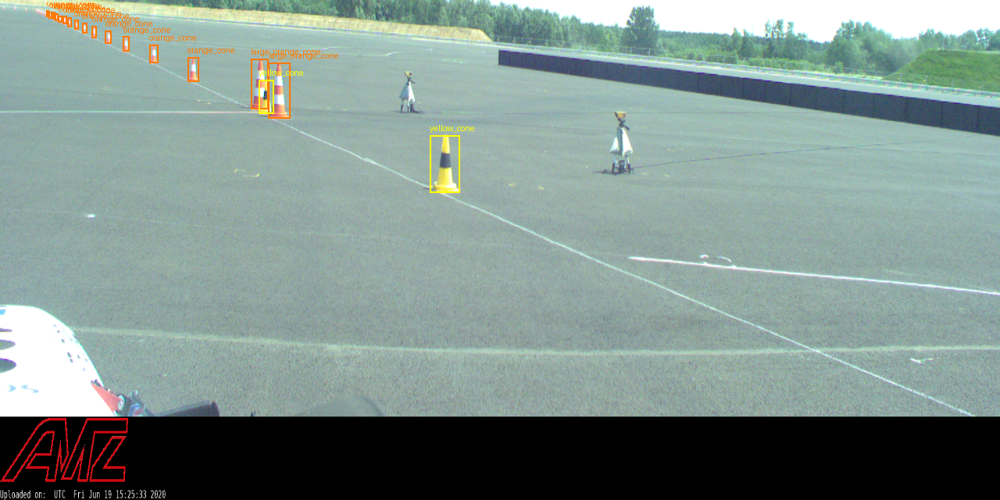

In [13]:
data = FS_COCO_Dataset(image_path_list, labels_path_list, test_transforms) 
image, target = data[8]
print(image.shape)
show_image_with_objects(image, target['boxes'], target['labels'])

In [14]:
class SSD(torch.nn.Module):
    def __init__(self, num_classes: int=4) -> None:
        super().__init__()
        
        self.num_classes = num_classes + 1
        self.model = torchvision.models.detection.ssdlite320_mobilenet_v3_large(pretrained=False, 
                                                                                pretrained_backbone=False, 
                                                                                num_classes=self.num_classes)

        for child in list(self.model.children()):
              for param in child.parameters():
                    param.requires_grad = True

    def predict(self, X: torch.Tensor) -> torch.Tensor:
        return self.model(X)

    # To calculate the loss function
    def forward(self, images: List[torch.Tensor], annotation: List[Dict[str, torch.Tensor]]) -> Dict[str, int]:
        return self.model(images, annotation)
    
SSD()

SSD(
  (model): SSD(
    (backbone): SSDLiteFeatureExtractorMobileNet(
      (features): Sequential(
        (0): Sequential(
          (0): Conv2dNormActivation(
            (0): Conv2d(3, 16, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
            (1): BatchNorm2d(16, eps=0.001, momentum=0.03, affine=True, track_running_stats=True)
            (2): Hardswish()
          )
          (1): InvertedResidual(
            (block): Sequential(
              (0): Conv2dNormActivation(
                (0): Conv2d(16, 16, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), groups=16, bias=False)
                (1): BatchNorm2d(16, eps=0.001, momentum=0.03, affine=True, track_running_stats=True)
                (2): ReLU(inplace=True)
              )
              (1): Conv2dNormActivation(
                (0): Conv2d(16, 16, kernel_size=(1, 1), stride=(1, 1), bias=False)
                (1): BatchNorm2d(16, eps=0.001, momentum=0.03, affine=True, track_running_stats=True)
   

In [15]:
train_data, test_data = train_test_split(list(zip(image_path_list[:1000], labels_path_list[:1000])), test_size=0.3, shuffle=True, random_state=42)
val_data, data_data = train_test_split(test_data, test_size=0.1, shuffle=True, random_state=42)

train_data = FS_COCO_Dataset(list(items[0] for items in train_data),
                             list(items[1] for items in train_data),
                             transform=train_transforms)

test_data = FS_COCO_Dataset(list(items[0] for items in test_data),
                            list(items[1] for items in test_data),
                            transform=test_transforms)

val_data = FS_COCO_Dataset(list(items[0] for items in val_data),
                           list(items[1] for items in val_data),
                           transform=test_transforms)

In [16]:
def collate_fn(batch):
    return tuple(zip(*batch))

train_dataloader = torch.utils.data.DataLoader(dataset=train_data,
                                               batch_size=8,
                                               shuffle=True,
                                               num_workers=os.cpu_count(),
                                               collate_fn=collate_fn)
val_dataloader = torch.utils.data.DataLoader(dataset=val_data,
                                             batch_size=8,
                                             shuffle=False,
                                             num_workers=os.cpu_count(),
                                             collate_fn=collate_fn)
test_dataloader = torch.utils.data.DataLoader(dataset=test_data,
                                              batch_size=4,
                                              shuffle=False,
                                              num_workers=os.cpu_count(),
                                              collate_fn=collate_fn)

In [17]:
def train_step(device: torch.device,
               model: torch.nn.Module,
               optimizer: torch.optim.Optimizer,
               dataloader: torch.utils.data.DataLoader,
               criterion: torch.nn.Module = None,
               scheduler: torch.optim.lr_scheduler = None):

    model.to(device)
    model.train()

    train_loss = 0
    torch.cuda.empty_cache()

    time_epoch_start = time()

    for batch, (images, annotations) in enumerate(dataloader):

        images = [torch.Tensor(image).to(device) for image in images]
        annotations = [{k: v.to(device) for k, v in t.items()} for t in annotations]

        if criterion == None:
            loss_dict = model(images, annotations)
            loss = sum(loss for loss in loss_dict.values())
        else:
            pass
        train_loss += loss.item()

        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
        if scheduler is not None:
            scheduler.step()

        print(f"LOSSES: {loss}")
        # print(model(images[0]))

    train_loss = train_loss / len(dataloader)
    time_epoch_end = time() - time_epoch_start

    return train_loss, time_epoch_end



@torch.no_grad()
def validation_step(device: torch.device,
                    model: torch.nn.Module,
                    dataloader: torch.utils.data.DataLoader,
                    criterion: torch.nn.Module = None):
    model.to(device)
    model.eval()

    val_loss = 0
    min_val_loss = 1e6
    torch.cuda.empty_cache()

    time_epoch_start = time()
    with torch.inference_mode():
        for batch, (images, annotations) in enumerate(dataloader):

            images = [torch.Tensor(image).to(device) for image in images]
            annotations = [{k: v.to(device) for k, v in t.items()} for t in annotations]

            if criterion == None:
                model.train()
                loss_dict = model(images, annotations)
                # print(loss_dict)
                loss = sum(loss for loss in loss_dict.values())
                model.eval()
            else:
                pass
            val_loss += loss.item()

      # print(f"TESTING MODEL {model.predict(images)}"
      # print(f"LOSSES: {loss}")

    val_loss /= len(dataloader)
    time_epoch_end = time() - time_epoch_start

  # val_loss = validate(epoch)
    if val_loss < min_val_loss:
        print('NEW BEST MODEL!')
        torch.save(model.state_dict(), 'best_model.pth')
        min_val_loss = val_loss
    torch.save(model.state_dict(), 'latest_model.pth')

    return val_loss, time_epoch_end



def train(model: torch.nn.Module,
          train_dataloader: torch.utils.data.DataLoader,
          val_dataloader: torch.utils.data.DataLoader,
          optimizer: torch.optim.Optimizer,
          epochs: int,
          device: torch.device):
    
    log_output = {
                  'train_loss': [],
                  'val_loss': [],
                  'val_mAP': []
                 }
    
    for epoch in tqdm(range(epochs)):
        train_loss, train_train_epoch = train_step(model=model,
                                                   dataloader=train_dataloader,
                                                   optimizer=optimizer,
                                                   device=device)

        print(f"EPOCH: {epoch+1} | TRAIN LOSS: {train_loss} | TRAIN TIME: {train_train_epoch}")

        val_loss, val_time_epoch = validation_step(model=model,
                                                   dataloader=test_dataloader,
                                                   device=device)
        log_output['train_loss'].append(train_loss)
        log_output['val_loss'].append(val_loss)
#         log_output['val_mAP'].append(train_loss)

        print(f"EPOCH: {epoch+1} | VAL LOSS: {val_loss} | VAL TIME: {val_time_epoch}\n")

In [18]:
num_epochs = 50
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

path_to_weights_model = pathlib.Path("best_model.pth")

model = SSD(data.num_classes)

model.load_state_dict(torch.load(path_to_weights_model, map_location=torch.device('cpu')))

params = [p for p in model.parameters() if p.requires_grad]
optimizer = torch.optim.AdamW(params, lr=1e-6)

train(model, train_dataloader, val_dataloader, optimizer, num_epochs, device)

  0%|          | 0/50 [00:01<?, ?it/s]


KeyboardInterrupt: 

In [4]:
import pathlib

path_to_weights_model = pathlib.Path("best_model.pth")

model = SSD(data.num_classes)

model.load_state_dict(torch.load(path_to_weights_model, map_location=torch.device('cpu')))

NameError: name 'SSD' is not defined

(3, 640, 1280)
[tensor(2), tensor(2), tensor(2)] tensor([[1057.7332,  356.5200, 1194.4077,  484.7053],
        [ 613.5065,  251.9570,  666.6136,  305.0411],
        [ 302.3024,  197.2921,  317.8381,  214.4052]]) tensor([0.9658, 0.5287, 0.3220])


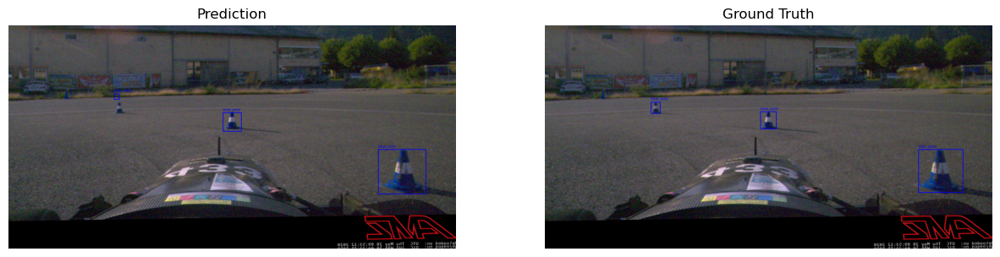

In [19]:
image, target = random.choice(train_data)
print(image.shape)

# images = [torch.Tensor(image.transpose(2, 0, 1)).to(device) for image in images]
# annotations = [{k: v.to(device) for k, v in t.items()} for t in annotations]

with torch.no_grad():
    model.eval()
    # model.to(device)
    outputs = model.predict(torch.Tensor(image).unsqueeze(dim=0).to(device))

bboxes, labels, scores = objects_threshold_scores(outputs[0]['boxes'].to('cpu'), outputs[0]['labels'], outputs[0]['scores'], 0.3)
print(labels, bboxes, scores)

fig, axes = plt.subplots(1, 2, figsize=(15, 7))
axes[0].imshow(show_image_with_objects(image, bboxes, labels))

axes[1].imshow(show_image_with_objects(image, target['boxes'], target['labels']))

axes[0].set_title("Prediction")
axes[1].set_title("Ground Truth")

axes[0].axis('off')
axes[1].axis('off')
plt.show()

(3, 640, 1280)
loading Roboflow workspace...
loading Roboflow project...
[0.9279884099960327, 0.9218626022338867, 0.897294282913208, 0.8810865879058838, 0.8721131086349487, 0.8475118279457092, 0.8470667004585266, 0.841302216053009, 0.8394943475723267, 0.8175948858261108, 0.8139775395393372, 0.8135347366333008, 0.8044155836105347, 0.8038122057914734, 0.7988348603248596, 0.784968376159668, 0.7682566046714783, 0.7243033051490784, 0.7094688415527344, 0.7060079574584961, 0.6760636568069458, 0.6655228137969971, 0.6637766361236572, 0.5585423707962036, 0.5468144416809082, 0.5432999134063721, 0.5428007245063782, 0.4717967212200165, 0.4695337116718292, 0.4682425558567047, 0.43681207299232483, 0.40508681535720825]


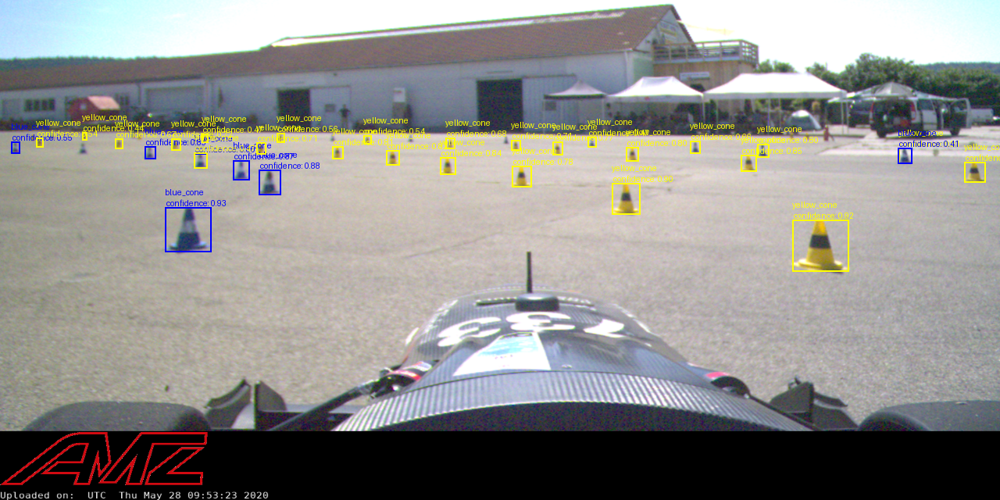

In [20]:
# from inference_sdk import InferenceHTTPClient

# CLIENT = InferenceHTTPClient(
#     api_url="https://detect.roboflow.com",
#     api_key="O2GZHfT0IgWwA2lVCZrr"
# )
# rd = str(random.choice(image_path_list))
# result = CLIENT.infer(rd, model_id="yolov6-training-segment-2/6")

from roboflow import Roboflow
import supervision as sv
import cv2

image, target = random.choice(test_data)
print(image.shape)
rf = Roboflow(api_key="O2GZHfT0IgWwA2lVCZrr")
project = rf.workspace().project("yolov6-training-segment-2")
model = project.version(6).model
# project = rf.workspace().project("fsae-cone")
# model = project.version(1).model

rd = str(random.choice(image_path_list))
result = model.predict(image.transpose(1, 2, 0), confidence=40, overlap=30).json()

# Извлечение bbox и меток из предсказаний
boxes = []
confidences = []
labels = []

LABEL2LABEL = dict([
    ("orange_cone", "blue_cone"),
    ("blue_cone", "yellow_cone"),
    ("large_orange_cone", "large_orange_cone"),
    ("yellow_cone", "yellow_cone")
    ])

for prediction in result['predictions']:
    x, y, width, height = prediction['x'], prediction['y'], prediction['width'], prediction['height']
    boxes.append([x - width / 2, y - height / 2, x + width / 2, y + height / 2,])  # Преобразуем в формат [xmin, ymin, width, height]
    confidences.append(prediction['confidence'])
    labels.append(LABEL2LABEL[prediction['class']])
print(confidences)
show_image_with_objects(image, torch.Tensor(boxes), labels, scores=confidences)

In [2]:
from __future__ import absolute_import, division, print_function
%matplotlib inline

import os
import numpy as np
import PIL.Image as pil
import matplotlib.pyplot as plt

import torch
from torchvision import transforms

import monodepth2.networks as networks
from monodepth2.utils import download_model_if_doesnt_exist

ModuleNotFoundError: No module named 'monodepth2'

In [81]:
model_name = "mono_640x192"

download_model_if_doesnt_exist(model_name)
encoder_path = os.path.join("models", model_name, "encoder.pth")
depth_decoder_path = os.path.join("models", model_name, "depth.pth")

# LOADING PRETRAINED MODEL
encoder = networks.ResnetEncoder(18, False)
depth_decoder = networks.DepthDecoder(num_ch_enc=encoder.num_ch_enc, scales=range(4))

loaded_dict_enc = torch.load(encoder_path, map_location='cpu')
filtered_dict_enc = {k: v for k, v in loaded_dict_enc.items() if k in encoder.state_dict()}
encoder.load_state_dict(filtered_dict_enc)

loaded_dict = torch.load(depth_decoder_path, map_location='cpu')
depth_decoder.load_state_dict(loaded_dict)

encoder.eval()
depth_decoder.eval()

DepthDecoder(
  (decoder): ModuleList(
    (0-1): 2 x ConvBlock(
      (conv): Conv3x3(
        (pad): ReflectionPad2d((1, 1, 1, 1))
        (conv): Conv2d(512, 256, kernel_size=(3, 3), stride=(1, 1))
      )
      (nonlin): ELU(alpha=1.0, inplace=True)
    )
    (2-3): 2 x ConvBlock(
      (conv): Conv3x3(
        (pad): ReflectionPad2d((1, 1, 1, 1))
        (conv): Conv2d(256, 128, kernel_size=(3, 3), stride=(1, 1))
      )
      (nonlin): ELU(alpha=1.0, inplace=True)
    )
    (4-5): 2 x ConvBlock(
      (conv): Conv3x3(
        (pad): ReflectionPad2d((1, 1, 1, 1))
        (conv): Conv2d(128, 64, kernel_size=(3, 3), stride=(1, 1))
      )
      (nonlin): ELU(alpha=1.0, inplace=True)
    )
    (6): ConvBlock(
      (conv): Conv3x3(
        (pad): ReflectionPad2d((1, 1, 1, 1))
        (conv): Conv2d(64, 32, kernel_size=(3, 3), stride=(1, 1))
      )
      (nonlin): ELU(alpha=1.0, inplace=True)
    )
    (7): ConvBlock(
      (conv): Conv3x3(
        (pad): ReflectionPad2d((1, 1, 1, 1)

(-0.5, 1279.5, 639.5, -0.5)

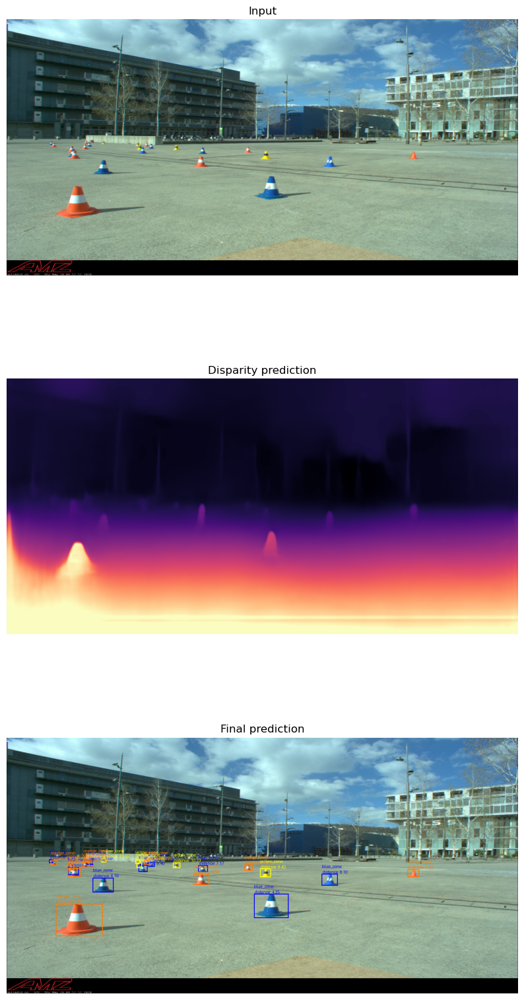

In [82]:
image, target = random.choice(test_data)
input_image = Image.fromarray(image.transpose(1, 2, 0))
original_width, original_height = input_image.size

feed_height = loaded_dict_enc['height']
feed_width = loaded_dict_enc['width']
input_image_resized = input_image.resize((feed_width, feed_height), pil.LANCZOS)

input_image_pytorch = transforms.ToTensor()(input_image_resized).unsqueeze(0)


with torch.no_grad():
    features = encoder(input_image_pytorch)
    outputs = depth_decoder(features)

disp = outputs[("disp", 0)]


disp_resized = torch.nn.functional.interpolate(disp,
    (original_height, original_width), mode="bilinear", align_corners=False)

# Saving colormapped depth image
disp_resized_np = disp_resized.squeeze().cpu().numpy()
vmax = np.percentile(disp_resized_np, 95)

fig, axes = plt.subplots(3, 1, figsize=(10, 20))

# axes[0].figure(figsize=(10, 10))
# axes[0].subplot(211)
axes[0].imshow(input_image)
axes[0].set_title("Input")
axes[0].axis('off')

# plt.subplot(212)
axes[1].imshow(disp_resized_np, cmap='magma', vmax=vmax)
axes[1].set_title("Disparity prediction")
axes[1].axis('off')


def get_cone_distances(detected_cones, depth_map):
    distances = []
    
    for bbox in detected_cones:
        # Координаты bounding box
        x1, y1, x2, y2 = int(bbox[0]), int(bbox[1]), int(bbox[2]), int(bbox[3])

        # Средняя глубина внутри bounding box
        depth_crop = depth_map[y1:y2, x1:x2]
        avg_depth = np.mean(depth_crop)
        distances.append(avg_depth)
    
    return distances

res = get_cone_distances(target['boxes'], 1 / disp_resized_np)

# plt.subplot(323)
axes[2].imshow(show_image_with_objects(image, target['boxes'], target['labels'], depths_value=res))
axes[2].set_title("Final prediction")
axes[2].axis('off')

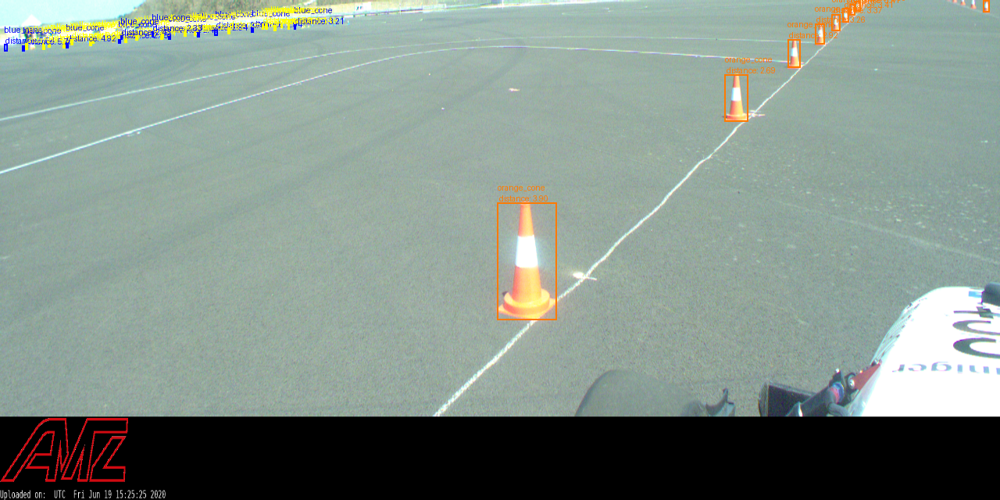

In [20]:
def get_cone_distances(detected_cones, depth_map):
    distances = []
    
    for bbox in detected_cones:
        # Координаты bounding box
        x1, y1, x2, y2 = int(bbox[0]), int(bbox[1]), int(bbox[2]), int(bbox[3])

        # Средняя глубина внутри bounding box
        depth_crop = depth_map[y1:y2, x1:x2]
        avg_depth = np.mean(depth_crop)
        distances.append(avg_depth)
    
    return distances

res = get_cone_distances(target['boxes'], 1 / disp_resized_np)

show_image_with_objects(image, target['boxes'], target['labels'], depths_value=res)